## HOD fitting results 

In [2]:
import sys
sys.path.insert(0, '/global/homes/s/shengyu/.local/perlmutter/python-3.11/lib/python3.11/site-packages')
import os, sys
import random
import yaml
import copy
import numpy as np
from HODDIES import HOD
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['legend.fontsize'] = 12
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [ ]:
sys.path.append('/global/homes/s/shengyu/project_rc/main/Y3/')
from helper import COLOR_TRACERS, REDSHIFT_LSS_VSMEAR, REDSHIFT_VSMEAR, REDSHIFT_ABACUS_Y3
result_dir = '/pscratch/sd/s/shengyu/galaxies/hod/fit/results/minimiser'

In [3]:
fit_result_fn = result_dir+f'/LRG/fitmini_LRG_z0.4-0.6_standard_00.npy'
np.load(fit_result_fn, allow_pickle=True).item()
# chi2 = np.load(fit_result_fn, allow_pickle=True).item().fun
# hod_param.append(np.load(fit_result_fn, allow_pickle=True).item().x[pind])

     fun: np.float64(334.9416428043401)
 message: 'maximum number of iterations is reached'
    nfev: 20000
     nit: 40
  status: -1
 success: False
       x: array([12.77268327, 13.86445705,  1.03022785,  0.8866657 , 12.81081698,
        0.41006254])

Set number of threads to 32


Load Compaso cat from /global/cfs/cdirs/desi/cosmosim/Abacus/AbacusSummit_highbase_c000_ph100/halos/z0.500 ...
Done took 00:00:12
Compute columns...
Done took  00:00:00
AbacusSummit_highbase_c000_ph100 at 0.5 loaded, took 00:00:12
Initialize Abacus c000 cosmology
Load data vector for LRG
Load rppi measurements at z0.4-0.6 for LRG...
Load smu measurements at z0.4-0.6 for LRG...
Load correlation matrix for LRG at z0.5 ...
Load data vector for LRG
Load rppi measurements at z0.4-0.6 for LRG...
Load smu measurements at z0.4-0.6 for LRG...
Best fit point: ('M_0_LRG', 12.772683266798857) ('M_1_LRG', 13.86445705422271) ('alpha_LRG', 1.030227847219731) ('f_sigv_LRG', 0.8866657009092258) ('log_Mcent_LRG', 12.81081697779473) ('sigma_M_LRG', 0.41006254344902815)
Set number of threads to 32
Load Compaso cat from /global/cfs/cdirs/desi/cosmosim/Abacus/AbacusSummit_highbase_c000_ph100/halos/z0.500 ...
Done took 00:00:12
Compute columns...
Done took  00:00:00
AbacusSummit_highbase_c000_ph100 at 0.5 lo

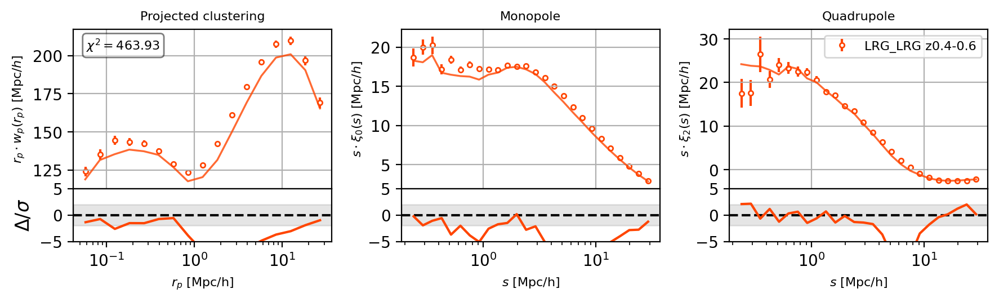

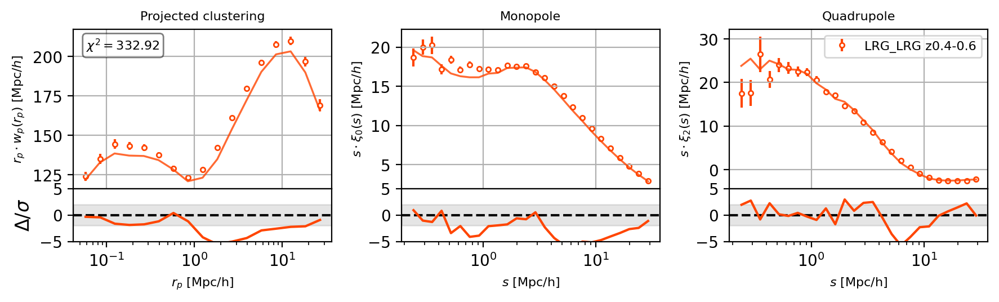

In [ ]:
#Plot best fit from a precomputed bes fit run 
tracer = 'LRG'
z_simu = REDSHIFT_ABACUS_Y3[tracer][0]
(zmin, zmax) = REDSHIFT_VSMEAR[tracer][0]
ind = 0
args_hod = yaml.load(open(f'../parameter_files/{tracer}_HOD_fit_param.yaml', 'r'), Loader=yaml.FullLoader)
args_hod['tracers'] = [tracer]
args_hod['hcat']['Abacus']['z_simu'] = z_simu
args_hod['fit_param']['zmin'] = zmin
args_hod['fit_param']['zmax'] = zmax
args_hod['fit_param']['zmax'] = zmax
for sysmodel in ['standard','dv-obs']:
    if sysmodel == 'standard':
        args_hod['fit_param']['use_vsmear'] = False
    elif sysmodel == 'dv-obs':
        args_hod['fit_param']['use_vsmear'] = True
    args_copy = copy.deepcopy(args_hod)
    HOD_obj = HOD(args=args_copy, path_to_abacus_sim='/global/cfs/cdirs/desi/cosmosim/Abacus')
    HOD_obj.initialize_fit(fix_seed=10)
    bf_file_fn = result_dir+f'/{tracer}/fitmini_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}.npy'
    HOD_obj.plot_bf_data(bf_file = bf_file_fn)
    HOD_obj.plot_bf_data(bf_file = bf_file_fn)


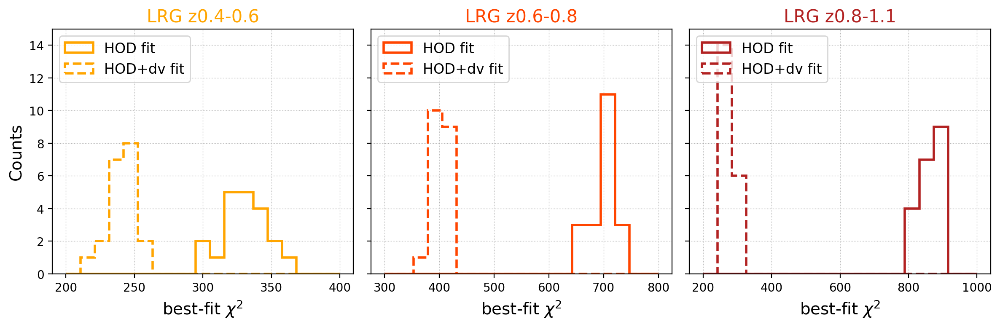

In [58]:
# plot the chisquare plot
tracer = 'LRG'
zrange = REDSHIFT_VSMEAR[tracer]
lenz = len(zrange)
num_bins = 20

fig, axes = plt.subplots(1, lenz, figsize=(lenz*4, 4), sharey=True)
bins_tracer = [np.linspace(200,400,num_bins), np.linspace(300,800,num_bins), np.linspace(200,1000,num_bins)]
colors = COLOR_TRACERS['LRG']
lss  = ['-','--']
labels = ['HOD fit', 'HOD+dv fit']

for zind, (zmin, zmax) in enumerate(zrange):
    ax = axes[zind]
    bins = bins_tracer[zind]
    # Plot standard and dv_obs histograms
    values = dict(std=[], dv_obs=[])
    for sind, sysmodel in enumerate(['standard', 'dv-obs']):
        chi2 = []
        for ind in range(20):
            fit_result_fn = result_dir+f'/{tracer}/fitmini_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}.npy'
            chi2.append(np.load(fit_result_fn, allow_pickle=True).item().fun)
        ax.hist(chi2,  histtype='step', 
                bins=bins_tracer[zind],
                color=colors[zind], lw=2, ls = lss[sind], label=labels[sind],)
    ax.set_title(f'{tracer} z{zmin}-{zmax}', fontsize=15, color = colors[zind])
    ax.set_xlabel(r'best-fit $\chi^2$', fontsize=14)
    if zind == 0:
        ax.set_ylabel('Counts', fontsize=14)
    ax.grid(True, ls=':', lw=0.5)
    ax.legend(loc=2, fontsize=12)
    ax.set_ylim(0, 15)
plt.tight_layout()
plt.show()

## Abacus halo cubic simulation --> Populate HOD to construct galaxy mocks--> compute 2pcf, wp -->  HOD fitting to observables --> results

## Abacus halo cubic simulation --> Populate HOD to construct galaxy mocks--> compute 2pcf, wp -->  +redshift errors --> HOD fitting to observables --> results



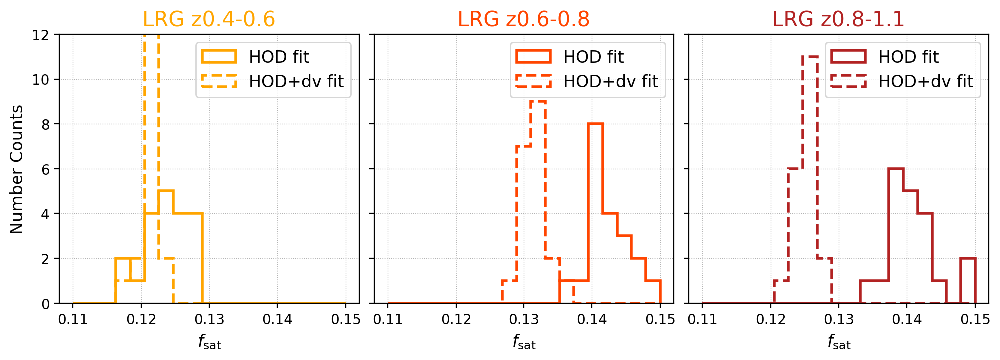

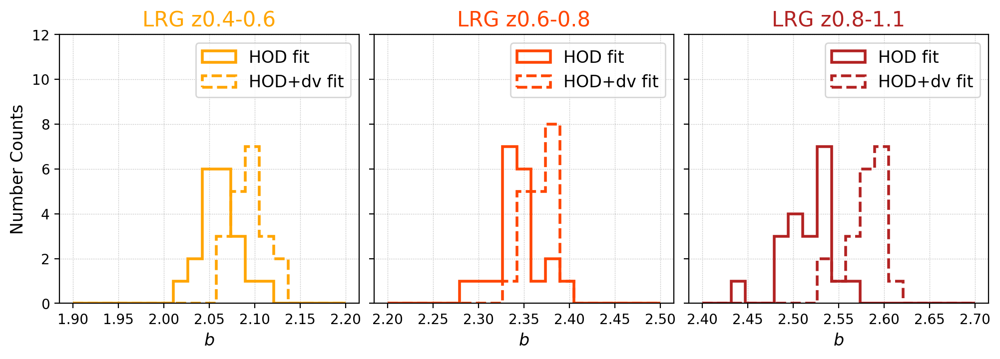

In [59]:
tracer = 'LRG'
# params = ['M_0', 'M_1', 'alpha', 'f_sigv', 'log_Mcent', 'sigma_M', 'fsat', 'b']
params = ['fsat', 'b']
num_bins = 20
param_set = dict(M_0 = (0, r'$M_0$', [np.linspace(12.7, 12.9, num_bins),np.linspace(12.2, 12.7, num_bins),np.linspace(12.2, 12.7, num_bins)]),
                   M_1 = (1, r'$M_1$', [np.linspace(13.75, 13.95, num_bins),np.linspace(13.75, 13.95, num_bins),np.linspace(13.65, 13.85, num_bins)]),
                   alpha = (2, r'$\alpha$', [np.linspace(0.93, 1.1, num_bins),np.linspace(0.95, 1.15, num_bins),np.linspace(0.95, 1.15, num_bins)]),
                   f_sigv = (3, r'$f_{\rm{sigv}}$', [np.linspace(0.825, 0.925, num_bins),np.linspace(0.9, 1., num_bins),np.linspace(0.9, 1.025, num_bins)]),
                   log_Mcent = (4, r'$\log(M_{\rm{cent}})$', [np.linspace(12.6, 13, num_bins), np.linspace(12.6, 13, num_bins), np.linspace(12.5, 13, num_bins)]),
                   sigma_M = (5,r'$\sigma_M$', [np.linspace(0.1, 0.6, num_bins),np.linspace(0.0, 0.6, num_bins),np.linspace(0.0, 0.6, num_bins)]),
                   fsat = (6,r'$f_{\rm{sat}}$', [np.linspace(0.11, 0.15, num_bins),np.linspace(0.11, 0.15, num_bins),np.linspace(0.11, 0.15, num_bins)]),
                   b = (7,r'$b$', [np.linspace(1.9, 2.2, num_bins),np.linspace(2.2, 2.5, num_bins),np.linspace(2.4, 2.7, num_bins)]),
                   )
labels = ['HOD fit', 'HOD+dv fit']
linestyles = ['-', '--']
if tracer == 'LRG':
    zrange = REDSHIFT_VSMEAR[tracer]
    lenz = len(zrange)
    colors = COLOR_TRACERS[tracer]
elif tracer == 'QSO':
    zrange = REDSHIFT_VSMEAR[tracer][:2]
    lenz = len(zrange)
    cmap = plt.get_cmap('coolwarm')
    colors = [cmap(i / (lenz - 1)) for i in range(lenz+1)] 
#load the fitting resutls
result_fn = '../results/LRG_hod_fit_results.npy'
hod_fits = np.load(result_fn, allow_pickle=True).item()
#plot the figure
for pind, param in enumerate(params):
    fig, axes = plt.subplots(1, lenz, figsize=(lenz*4, 3.5), sharey=True)
    plt.subplots_adjust(wspace=0.05)
    for zind, (zmin, zmax) in enumerate(zrange):
        z_simu = REDSHIFT_ABACUS_Y3[tracer][zind]
        ax = axes[zind]
        # color = COLOR_TRACERS[tracer][zind]
        (pind, param_name, param_bins) = param_set[param]
        for sind, sysmodel in enumerate(['standard', 'dv-obs']):   
            hod_param = []
            for ind in range(20):
                hod_id = f'id_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}'     
                hod_fit = hod_fits[hod_id]
                hod_param.append(hod_fit[param])
                # fit_result_fn = result_dir+f'/fitmini_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}.npy'
                # hod_param.append(np.load(fit_result_fn, allow_pickle=True).item().x[pind])
            ax.hist(hod_param, histtype='step', 
                    color=colors[zind], lw=2, linestyle=linestyles[sind], label=labels[sind],
                    bins=param_bins[zind]
                    )
        ax.set_title(f'{tracer} z{zmin}-{zmax}', fontsize=15, color = colors[zind])
        ax.grid(True, ls=':', lw=0.5)
        ax.legend(loc=1, fontsize=12)
        ax.set_ylim(0, 12)
        ax.set_xlabel(param_name)
        if zind == 0:
            ax.set_ylabel('Number Counts', fontsize=12)

In [ ]:
tracer = 'LRG'
params = ['M_0', 'M_1', 'alpha', 'f_sigv', 'log_Mcent', 'sigma_M']
# params = ['sigma_M']
num_bins = 15
param_set = dict(M_0 = (0, r'$M_0$', [np.linspace(12.7, 12.9, num_bins),np.linspace(12.2, 12.7, num_bins),np.linspace(12.2, 12.7, num_bins)]),
                   M_1 = (1, r'$M_1$', [np.linspace(13.75, 13.95, num_bins),np.linspace(13.75, 13.95, num_bins),np.linspace(13.65, 13.85, num_bins)]),
                   alpha = (2, r'$\alpha$', [np.linspace(0.93, 1.1, num_bins),np.linspace(0.95, 1.15, num_bins),np.linspace(0.95, 1.15, num_bins)]),
                   f_sigv = (3, r'$f_{\rm{sigv}}$', [np.linspace(0.825, 0.925, num_bins),np.linspace(0.9, 1., num_bins),np.linspace(0.9, 1.025, num_bins)]),
                   log_Mcent = (4, r'$\log(M_{\rm{cent}})$', [np.linspace(12.6, 13, num_bins), np.linspace(12.6, 13, num_bins), np.linspace(12.5, 13, num_bins)]),
                   sigma_M = (5,r'$\sigma_M$', [np.linspace(0.1, 0.6, num_bins),np.linspace(0.0, 0.6, num_bins),np.linspace(0.0, 0.6, num_bins)]),
                   )
labels = ['HOD fit', 'HOD+dv fit']
linestyles = ['-', '--']
if tracer == 'LRG':
    zrange = REDSHIFT_VSMEAR[tracer]
    lenz = len(zrange)
    colors = COLOR_TRACERS[tracer]
elif tracer == 'QSO':
    zrange = REDSHIFT_VSMEAR[tracer][:2]
    lenz = len(zrange)
    cmap = plt.get_cmap('coolwarm')
    colors = [cmap(i / (lenz - 1)) for i in range(lenz+1)] 

result_fn = '../results/LRG_hod_fit_results.npy'
hod_fits = np.load(result_fn, allow_pickle=True)
for pind, param in enumerate(params):
    fig, axes = plt.subplots(1, lenz, figsize=(lenz*4, 3.5), sharey=True)
    plt.subplots_adjust(wspace=0.05)
    for zind, (zmin, zmax) in enumerate(zrange):
        z_simu = REDSHIFT_ABACUS_Y3[tracer][zind]
        ax = axes[zind]
        # color = COLOR_TRACERS[tracer][zind]
        (pind, param_bins) = param_set[param]
        for sind, sysmodel in enumerate(['standard', 'dv-obs']):
            hod_id = f'id_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}'     
            hod_param = []
            for ind in range(20):
                hod_id = f'id_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}'     
                hod_fit = hod_fits[id]

                # fit_result_fn = result_dir+f'/fitmini_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}.npy'
                # hod_param.append(np.load(fit_result_fn, allow_pickle=True).item().x[pind])
            ax.hist(hod_param, histtype='step', 
                    color=colors[zind], lw=2, linestyle=linestyles[sind], label=labels[sind],
                    # bins=param_bins[zind]
                    )
        ax.set_title(f'{tracer} z{zmin}-{zmax}', fontsize=15, color = colors[zind])
        ax.grid(True, ls=':', lw=0.5)
        ax.legend(loc=1, fontsize=12)
        ax.set_ylim(0, 12)
        ax.set_xlabel(params_names[pind])
        if zind == 0:
            ax.set_ylabel('Number Counts', fontsize=12)

Set number of threads to 32


Load Compaso cat from /global/cfs/cdirs/desi/cosmosim/Abacus/AbacusSummit_highbase_c000_ph100/halos/z0.500 ...
Done took 00:00:11
Compute columns...
Done took  00:00:00
AbacusSummit_highbase_c000_ph100 at 0.5 loaded, took 00:00:11
Initialize Abacus c000 cosmology
Load data vector for LRG
Load rppi measurements at z0.4-0.6 for LRG...
Load smu measurements at z0.4-0.6 for LRG...
Best fit point: ('M_0_LRG', 12.772683266798857) ('M_1_LRG', 13.86445705422271) ('alpha_LRG', 1.030227847219731) ('f_sigv_LRG', 0.8866657009092258) ('log_Mcent_LRG', 12.81081697779473) ('sigma_M_LRG', 0.41006254344902815)
Load data vector for LRG
Load rppi measurements at z0.4-0.6 for LRG...
Load smu measurements at z0.4-0.6 for LRG...
Best fit point: ('M_0_LRG', 12.80374329976932) ('M_1_LRG', 13.836050469839485) ('alpha_LRG', 0.9956028735137071) ('f_sigv_LRG', 0.8853653297056621) ('log_Mcent_LRG', 12.783686686904181) ('sigma_M_LRG', 0.38267585271614313)
Load data vector for LRG
Load rppi measurements at z0.4-0.6 

/global/homes/s/shengyu/.conda/envs/hod_env/lib/python3.11/site-packages/HODDIES/hod.py:2120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


Load data vector for LRG
Load rppi measurements at z0.4-0.6 for LRG...
Load smu measurements at z0.4-0.6 for LRG...
Best fit point: ('M_0_LRG', 12.752364592987865) ('M_1_LRG', 13.8635227758322) ('alpha_LRG', 1.048013816942517) ('f_sigv_LRG', 0.8743457758051705) ('log_Mcent_LRG', 12.737041070960588) ('sigma_M_LRG', 0.23685291978477518)
Load data vector for LRG
Load rppi measurements at z0.4-0.6 for LRG...
Load smu measurements at z0.4-0.6 for LRG...
Best fit point: ('M_0_LRG', 12.796314065606355) ('M_1_LRG', 13.851658076026316) ('alpha_LRG', 1.023322847604022) ('f_sigv_LRG', 0.873901876811329) ('log_Mcent_LRG', 12.738657777632818) ('sigma_M_LRG', 0.23944041351389161)
Load data vector for LRG
Load rppi measurements at z0.4-0.6 for LRG...
Load smu measurements at z0.4-0.6 for LRG...
Best fit point: ('M_0_LRG', 12.827420046203123) ('M_1_LRG', 13.847691074766079) ('alpha_LRG', 1.014806785404942) ('f_sigv_LRG', 0.861281633585443) ('log_Mcent_LRG', 12.748092320197633) ('sigma_M_LRG', 0.272210

/global/homes/s/shengyu/.conda/envs/hod_env/lib/python3.11/site-packages/HODDIES/hod.py:526: UserWarning: Ac=1.0 or As=1.0 is > 1, the density is not fixed to 0.0007
  warnings.warn(f'Ac={hod_list_param_cen[0]} or As={hod_list_param_cen[0]} is > 1, the density is not fixed to {self.args[tracer]["density"]}')


Load data vector for LRG
Load rppi measurements at z0.6-0.8 for LRG...
Load smu measurements at z0.6-0.8 for LRG...
Best fit point: ('M_0_LRG', 12.507198321206557) ('M_1_LRG', 13.857009503828078) ('alpha_LRG', 1.0472972732593904) ('f_sigv_LRG', 0.9727452141957513) ('log_Mcent_LRG', 12.839582716796672) ('sigma_M_LRG', 0.42490818243482004)
Load data vector for LRG
Load rppi measurements at z0.6-0.8 for LRG...
Load smu measurements at z0.6-0.8 for LRG...
Best fit point: ('M_0_LRG', 12.356987916958959) ('M_1_LRG', 13.885940568370888) ('alpha_LRG', 1.0946708114482304) ('f_sigv_LRG', 0.9757603222897686) ('log_Mcent_LRG', 12.857561677732752) ('sigma_M_LRG', 0.433868286087282)
Load data vector for LRG
Load rppi measurements at z0.6-0.8 for LRG...
Load smu measurements at z0.6-0.8 for LRG...
Best fit point: ('M_0_LRG', 12.525003138044843) ('M_1_LRG', 13.848970515812814) ('alpha_LRG', 1.055986454373584) ('f_sigv_LRG', 0.9579121794863714) ('log_Mcent_LRG', 12.841041144692346) ('sigma_M_LRG', 0.43

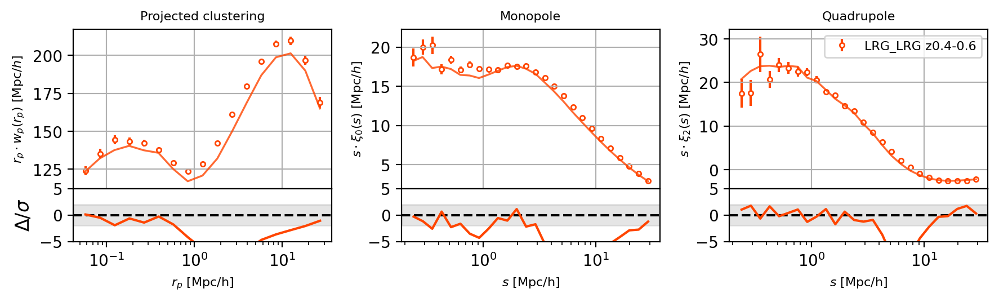

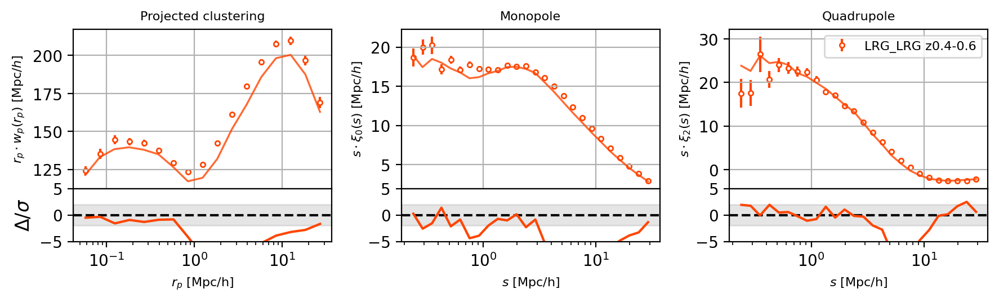

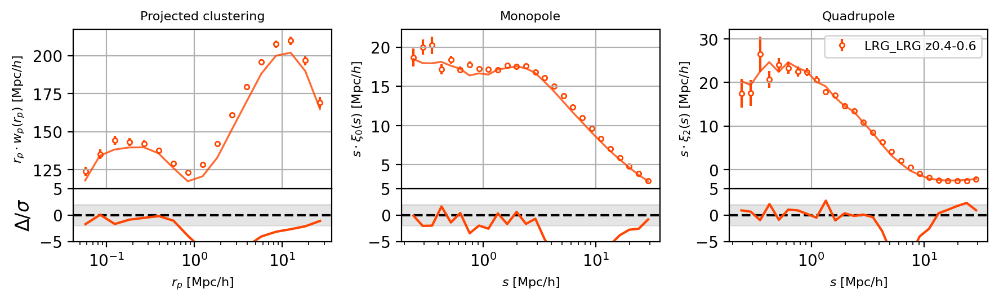

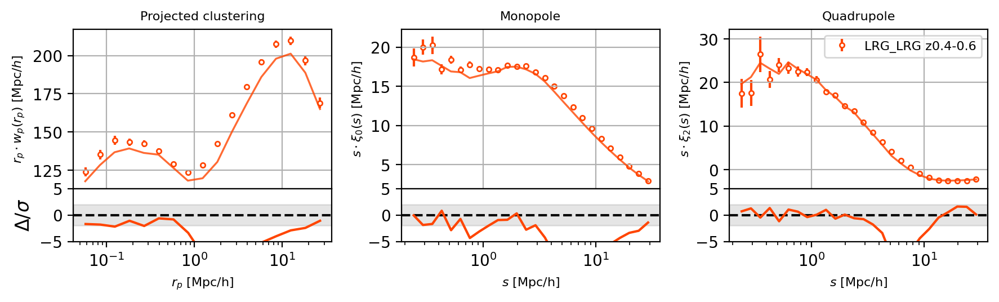

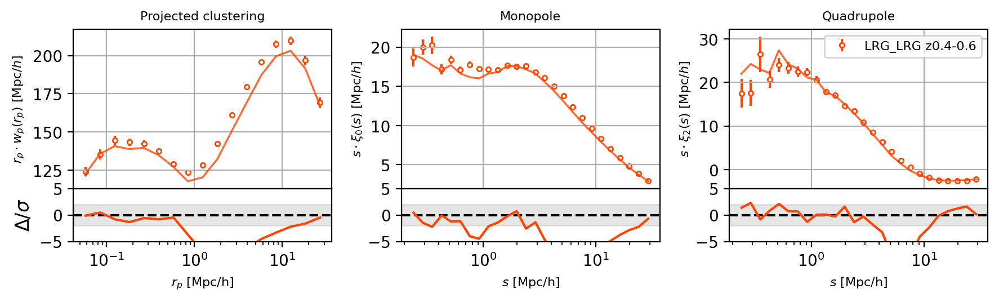

...

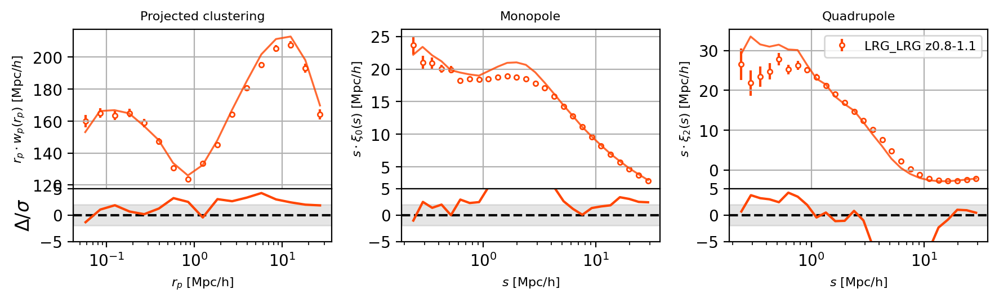

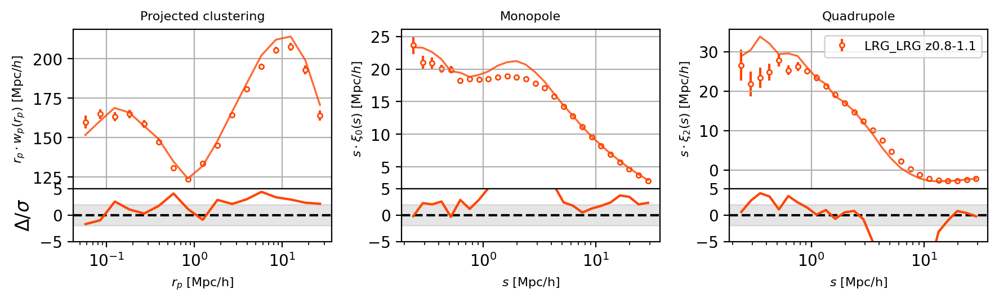

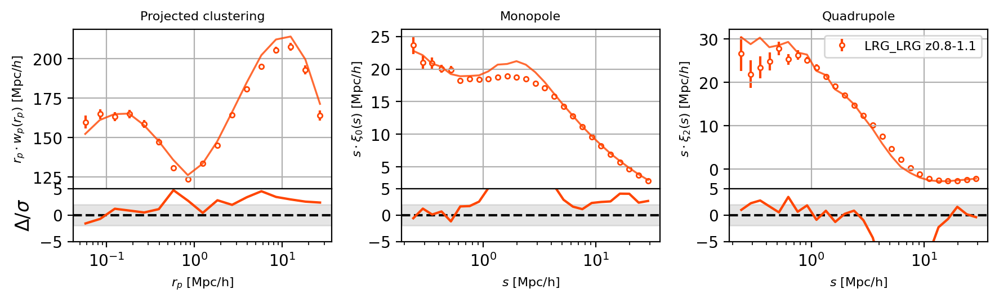

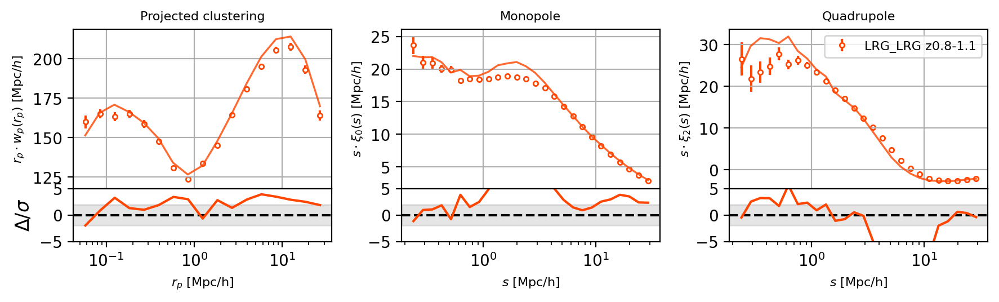

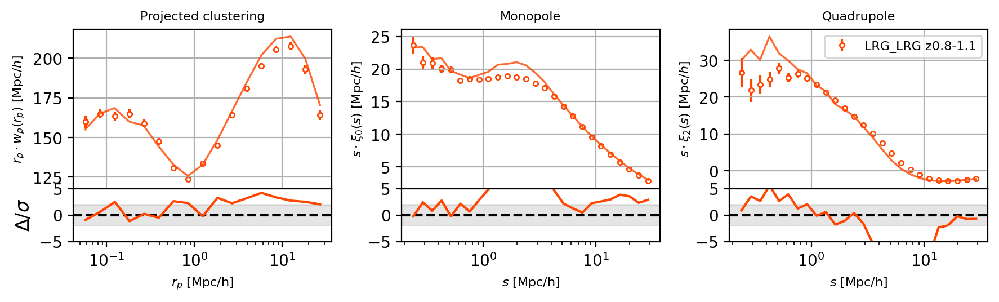

In [ ]:
tracer ='LRG'
params = ['M_0', 'M_1', 'alpha', 'f_sigv', 'log_Mcent', 'sigma_M']
zrange = REDSHIFT_VSMEAR[tracer]
hod_fits = {}        
for zind, (zmin, zmax) in enumerate(zrange):
    z_simu = REDSHIFT_ABACUS_Y3[tracer][zind]
    for sind, sysmodel in enumerate(['standard', 'dv-obs']):
        #generate HOD model
        args_hod = yaml.load(open(f'../parameter_files/{tracer}_HOD_fit_param.yaml', 'r'), Loader=yaml.FullLoader)
        args_hod['tracers'] = [tracer]
        args_hod['hcat']['Abacus']['z_simu'] = z_simu
        args_hod['fit_param']['zmin'] = zmin
        args_hod['fit_param']['zmax'] = zmax
        if sysmodel == 'standard':
            args_hod['fit_param']['use_vsmear'] = False
        elif sysmodel == 'dv-obs':
            args_hod['fit_param']['use_vsmear'] = True
        args_copy = copy.deepcopy(args_hod)
        HOD_obj = HOD(args=args_copy, path_to_abacus_sim='/global/cfs/cdirs/desi/cosmosim/Abacus')
        for ind in range(20):
            hod_id = f'id_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}'     
            hod_fit = {}
            #save the best fit parameters and chi2        
            fit_result_fn = result_dir+f'/{tracer}/fitmini_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}.npy'
            result = np.load(fit_result_fn, allow_pickle=True).item()
            hod_fit['chi2'] = result.fun
            for i,param in enumerate(params): 
                hod_fit[param] = result.x[i]
            #save the satellite fraction
            HOD_obj.plot_bf_data(bf_file = fit_result_fn) 
            (ngal, fsat) = HOD_obj.ngal('LRG')
            hod_fit['ngal'] = ngal
            hod_fit['fsat'] = fsat
            #save the galaxy bias
            b = HOD_obj.get_lin_bias()
            hod_fit['b'] = b
            # # save to the final fit
            hod_fits[hod_id] = hod_fit
result_fn = '../results/LRG_hod_fit_results.npy'
np.save(result_fn, hod_fits, allow_pickle=True)

In [20]:
hod_fits

{'id_LRG_z0.4-0.6_standard_00': {'chi2': 334.9416428043401,
  'M_0': 12.772683266798857,
  'M_1': 13.86445705422271,
  'alpha': 1.030227847219731,
  'f_sigv': 0.8866657009092258,
  'log_Mcent': 12.81081697779473,
  'sigma_M': 0.41006254344902815,
  'ngal': 804778.8271385727,
  'fsat': 0.12297208073475549,
  'b': 2.037123653711514},
 'id_LRG_z0.4-0.6_standard_01': {'chi2': 338.918640308558,
  'M_0': 12.80374329976932,
  'M_1': 13.836050469839485,
  'alpha': 0.9956028735137071,
  'f_sigv': 0.8853653297056621,
  'log_Mcent': 12.783686686904181,
  'sigma_M': 0.38267585271614313,
  'ngal': 837330.2745477757,
  'fsat': 0.12535346160593164,
  'b': 2.0607965308257787},
 'id_LRG_z0.4-0.6_standard_02': {'chi2': 317.7709268661105,
  'M_0': 12.806483206347798,
  'M_1': 13.865044508818372,
  'alpha': 0.998976967065094,
  'f_sigv': 0.8819107520249306,
  'log_Mcent': 12.820403499639005,
  'sigma_M': 0.41771435981190863,
  'ngal': 792916.3231366004,
  'fsat': 0.1231321857610078,
  'b': 2.0113099442773

In [21]:
result_fn = '../results/LRG_hod_fit_results.npy'
np.save(result_fn, hod_fits, allow_pickle=True)

In [ ]:
loaded = np.load(result_fn, allow_pickle=True).item()
loaded

120

Set number of threads to 32


Load Compaso cat from /global/cfs/cdirs/desi/cosmosim/Abacus/AbacusSummit_highbase_c000_ph100/halos/z0.500 ...
Done took 00:00:12
Compute columns...
Done took  00:00:00
AbacusSummit_highbase_c000_ph100 at 0.5 loaded, took 00:00:13
Initialize Abacus c000 cosmology
Load data vector for LRG
Load rppi measurements at z0.4-0.6 for LRG...
Load smu measurements at z0.4-0.6 for LRG...
Best fit point: ('M_0_LRG', 12.772683266798857) ('M_1_LRG', 13.86445705422271) ('alpha_LRG', 1.030227847219731) ('f_sigv_LRG', 0.8866657009092258) ('log_Mcent_LRG', 12.81081697779473) ('sigma_M_LRG', 0.41006254344902815)


2.0320487472993967

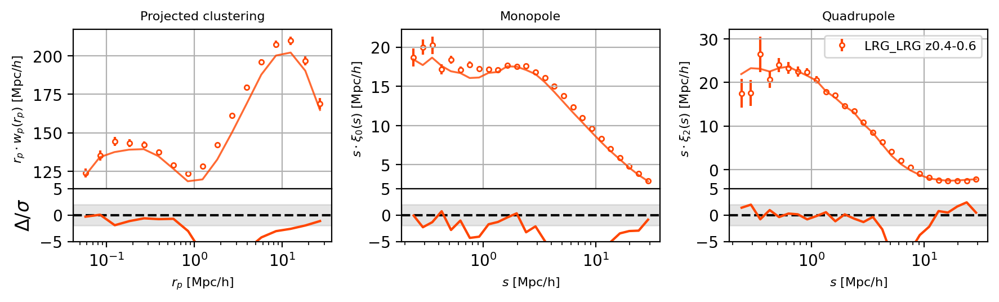

In [ ]:
tracer = 'LRG'
sysmodel = 'standard'
(zmin, zmax) = REDSHIFT_VSMEAR[tracer][0]
z_simu = REDSHIFT_ABACUS_Y3[tracer][0]
ind = 0

args_hod = yaml.load(open(f'../parameter_files/{tracer}_HOD_fit_param.yaml', 'r'), Loader=yaml.FullLoader)
args_hod['tracers'] = [tracer]
args_hod['hcat']['Abacus']['z_simu'] = z_simu
args_hod['fit_param']['zmin'] = zmin
args_hod['fit_param']['zmax'] = zmax
if sysmodel == 'standard':
    args_hod['fit_param']['use_vsmear'] = False
elif sysmodel == 'dv-obs':
    args_hod['fit_param']['use_vsmear'] = True
args_copy = copy.deepcopy(args_hod)
HOD_obj=HOD(args=args_copy, path_to_abacus_sim='/global/cfs/cdirs/desi/cosmosim/Abacus')
fit_result_fn = result_dir+f'/{tracer}/fitmini_{tracer}_z{zmin}-{zmax}_{sysmodel}_{ind:02}.npy'
HOD_obj.plot_bf_data(bf_file = fit_result_fn)
HOD_obj.get_lin_bias()

## ----------------------------------------------------------------------------------------------
## ----------------------------------------------------------------------------------------------


## Other tests

In [ ]:
# === Chi2 scatter plotting ===

all_tracers = ['LRG1', 'LRG2', 'LRG3']
markers = ['o', 's', '^', 'D', 'v', '*', 'x', 'P']

fig = plt.figure(figsize=(5, 5))
inner_gs = gridspec.GridSpec(2, 2, 
                       width_ratios=[4, 1], height_ratios=[1, 4],
                       hspace=0.0, wspace=0.0,
                       left=0.05, right=0.98, top=0.95, bottom=0.05,)
ax_main  = fig.add_subplot(inner_gs[1,0])   # central scatter
ax_right  = fig.add_subplot(inner_gs[1,1], sharey=ax_main)  # y–hist
ax_top   = fig.add_subplot(inner_gs[0,0], sharex=ax_main)  # x–hist

for i, (tracer, values) in enumerate(chi2_data.items()):

    # colormap = get_cmap('plasma') if 'dv-LRG' in sys_models else get_cmap('viridis')
    color = COLOR_TRACERS['LRG'][i] 
    marker = markers[i]

    x = values['dv_obs']
    y = values['std']
    bins = np.linspace(100,1200, 40)

    # Scatter plot
    # ax_main.scatter(x, y, alpha=0.8, s=25, color='C0')
    ax_main.scatter(x, y, s=10, alpha=1.0, 
                    color = color, marker=marker,
                    label = f'{tracer}')
    ax_top.hist(x, bins=bins, histtype='step', density=True, color = color)
    ax_right.hist(y, bins=bins, histtype='step', density=True,
                orientation='horizontal', edgecolor = color)

    ax_main.set_xlabel('Chi² (dv_obs)', fontsize=12)
    ax_main.set_ylabel('Chi² (standard)', fontsize=12)
    ax_main.grid(True, ls=':', lw=0.5)

    lims = (bins[0], bins[-1])
    ax_main.plot(lims, lims, 'k--', lw=1.4)
    ax_main.set_xlim(lims)
    ax_main.set_ylim(lims)
    ax_main.set_yticks(ax_main.get_xticks())
    ax_main.legend(loc=4, fontsize=11)
    # ax_main.set_xlabel(get_mcmc_stick_label(plot_task, 'chi2')[0], fontsize=14)
    # ax_main.set_ylabel(get_mcmc_stick_label(plot_task, 'chi2')[1], fontsize=14)

    # Remove spines
    plt.setp(ax_top.get_yticklabels(),  visible=False)
    ax_top.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
    plt.setp(ax_right.get_xticklabels(), visible=False)
    ax_right.tick_params(axis='y', which='both', left=False, labelleft=False)
plt.tight_layout()

In [ ]:
# chi2_data = {
#     'LRG1': {
#         'std': np.array([415.53, 429.67, 426.97, 449.93, 408.52, 441.51, 436.85, 438.04, 428.49, 394.12, 
#                          389.78, 407.79, 413.38, 437.57, 454.78, 426.67, 457.61, 425.38, 417.54, 447.84]),
#         'dv_obs': np.array([284.53, 309.41, 311.28, 253.08, 292.51, 317.25, 297.95, 304.48, 319.26, 332.74, 
#                             326.52, 305.87, 288.65, 315.58, 329.85, 287.23, 298.95, 305.90, 305.89, 304.44])
#     },
#     'LRG2': {
#         'std': np.array([860.63, 826.99, 783.36, 874.18, 897.26, 867.99, 880.44, 815.17, 878.31, 881.76,
#                          867.57, 797.86, 889.51, 827.70, 857.21, 825.32, 797.38, 813.61, 856.90, 869.41]),
#         'dv_obs': np.array([523.05, 517.05, 483.77, 516.04, 528.15, 477.68, 517.59, 456.12, 483.93, 460.16,
#                             554.22, 533.69, 531.00, 457.08, 499.36, 512.77, 488.58, 561.46, 498.55, 480.04])
#     },
#     'LRG3': {
#         'std': np.array([935.94, 1051.12, 1057.21, 930.15, 990.87, 1106.22, 972.19, 1056.73, 1064.16, 996.78, 
#                          1055.01, 894.34, 1032.86, 1022.22, 968.45, 1000.81, 1049.46, 977.54, 973.77, 980.25]),
#         'dv_obs': np.array([411.98, 329.72, 348.70, 299.03, 366.01, 346.64, 310.89, 331.58, 424.47, 392.32,
#                             353.57, 352.69, 310.58, 380.21, 422.83, 417.10, 409.27, 397.96, 392.43, 303.00])
#     }
# }